✅ All required libraries are installed!

🔬 XAI GRAD-CAM ANALYSIS FOR SEMACHEX-FORMER
Device: cuda
Model Path: /kaggle/input/best-model/pytorch/default/1/best_model (1).pth
Dataset Path: /kaggle/input/data

📂 Loading dataset...
✅ Loaded 112120 images
✅ Labels: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']

✅ Validation set: 1000 images

🤖 Loading model...
✅ Model loaded successfully!

🎨 GENERATING GRAD-CAM VISUALIZATIONS


--- 🧠 Performing XAI Analysis (Grad-CAM) on Validation Set ---


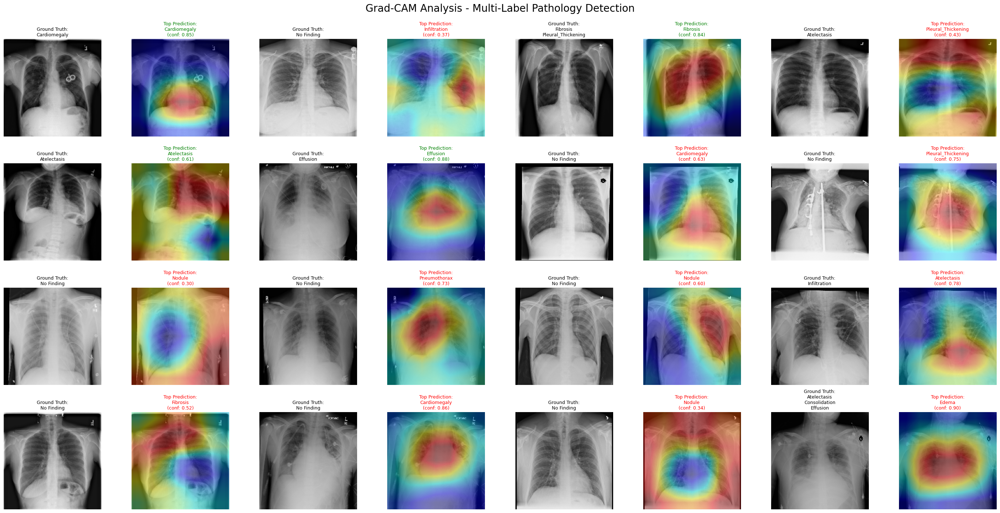


--- 🧠 XAI Analysis for Pneumonia ---


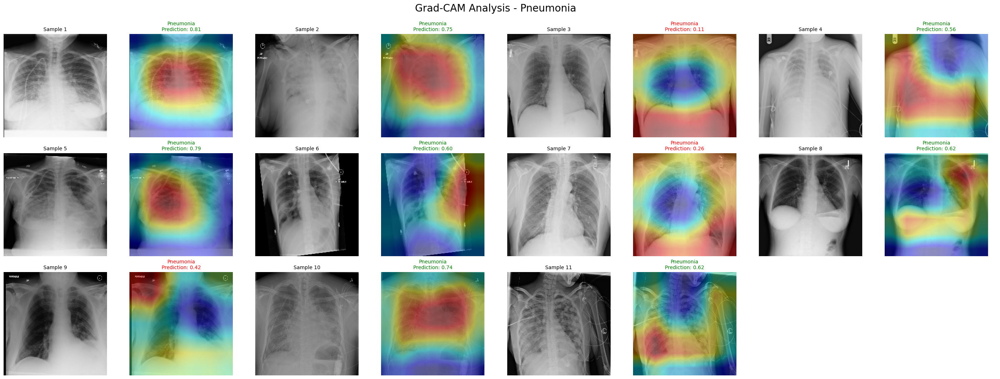


--- 🧠 XAI Analysis for Atelectasis ---


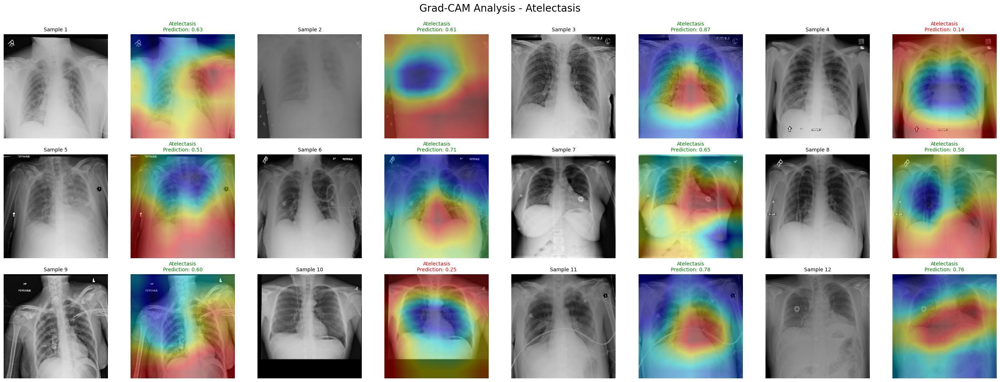


--- 🧠 XAI Analysis for Effusion ---


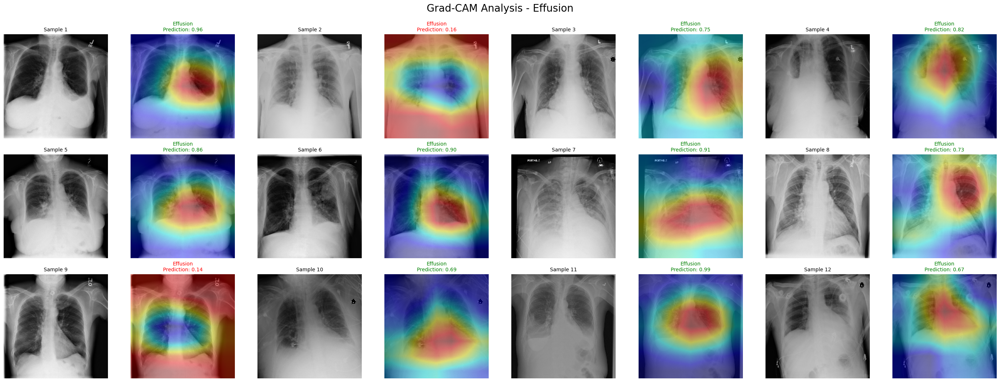


--- 🧠 XAI Analysis for Infiltration ---


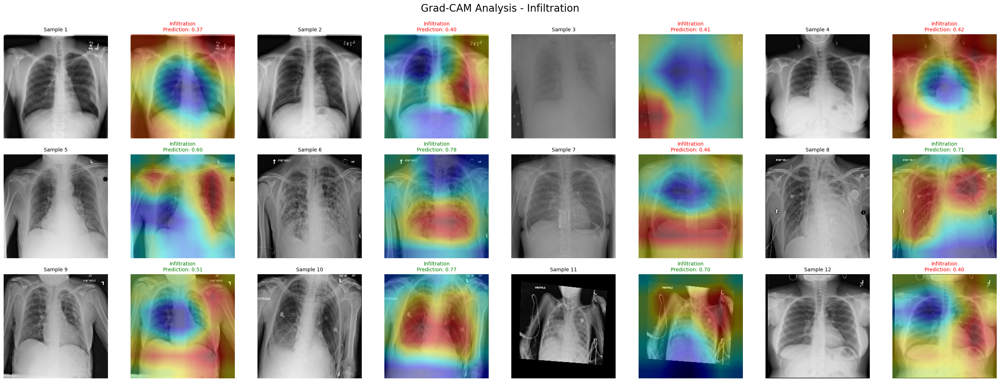


✅ XAI ANALYSIS COMPLETE!


In [2]:
# ==============================================================================
# COMPLETE XAI GRAD-CAM SCRIPT FOR SEMACHEX-FORMER
# Loads model and dataset from Kaggle input and visualizes predictions
# ==============================================================================

# Auto-install required libraries if not present
import subprocess
import sys

def install_if_missing(package):
    try:
        __import__(package)
    except ImportError:
        print(f"📦 Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

# Check and install required packages
required_packages = ['torchxrayvision', 'einops', 'albumentations', 'captum']
for package in required_packages:
    install_if_missing(package)

print("✅ All required libraries are installed!\n")

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import glob

import torchxrayvision as xrv
from einops import rearrange
from einops.layers.torch import Rearrange
import albumentations as A
from albumentations.pytorch import ToTensorV2

from captum.attr import LayerGradCam

# ==============================================================================
# 1. MODEL ARCHITECTURE (Same as training script)
# ==============================================================================

class TransformerEncoderBlock(nn.Module):
    def __init__(self, dim, num_heads, mlp_dim, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(dim, num_heads, dropout=dropout, batch_first=True)
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, mlp_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_dim, dim),
            nn.Dropout(dropout)
        )
    
    def forward(self, x):
        normed_x = self.norm1(x)
        x = x + self.attn(normed_x, normed_x, normed_x)[0]
        x = x + self.mlp(self.norm2(x))
        return x

class PartitionReconstructionAttentionBlock_LMSA(nn.Module):
    def __init__(self, in_channels, dim, patch_size, num_heads, mlp_dim, num_classes, dropout=0.1):
        super().__init__()
        self.patch_size = patch_size
        patch_dim = in_channels * (patch_size ** 2)
        self.partition = Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size)
        self.patch_projection = nn.Linear(patch_dim, dim)
        self.label_embeddings = nn.Parameter(torch.randn(1, num_classes, dim))
        self.attention_module = TransformerEncoderBlock(dim, num_heads, mlp_dim, dropout)
    
    def forward(self, x):
        b, _, h, w = x.shape
        tokens = self.partition(x)
        label_embs = self.label_embeddings.expand(b, -1, -1)
        tokens = self.patch_projection(tokens)
        processed_tokens = self.attention_module(torch.cat((tokens, label_embs), dim=1))
        processed_visual_tokens = processed_tokens[:, :tokens.shape[1]]
        recon_h, recon_w = h // self.patch_size, w // self.patch_size
        return rearrange(processed_visual_tokens, 'b (h w) d -> b d h w', h=recon_h, w=recon_w)

class ConvSEBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, reduction=8):
        super().__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, padding='same', bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(out_channels, out_channels // reduction, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels // reduction, out_channels, 1, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        cnn_out = self.conv_block(x)
        return cnn_out * self.se(cnn_out)

class SemaCheXFormer(nn.Module):
    def __init__(self, num_classes=14, dim=256, num_heads=8, mlp_dim=512, cnn_channels=256):
        super().__init__()
        pretrained_model = xrv.models.DenseNet(weights="densenet121-res224-nih")
        self.backbone = pretrained_model.features
        self.backbone.conv0 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.backbone.norm0 = nn.BatchNorm2d(64)
        backbone_out_channels = 1024
        self.attention_stage = PartitionReconstructionAttentionBlock_LMSA(
            backbone_out_channels, dim, 1, num_heads, mlp_dim, num_classes
        )
        self.cnn_se_stage = ConvSEBlock(dim, cnn_channels)
        self.classification_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(cnn_channels, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        attention_out = self.attention_stage(features)
        cnn_out = self.cnn_se_stage(attention_out)
        return self.classification_head(cnn_out)

# ==============================================================================
# 2. DATASET CLASS (Same as training script)
# ==============================================================================

class NIHChestXrayDataset(Dataset):
    def __init__(self, df, labels, transform=None, is_val=False):
        self.df = df
        self.transform = transform
        self.labels = labels
        self.is_val = is_val
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = row['FullPath']
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        original_image = cv2.resize(image, (224, 224))
        
        if self.transform:
            image = self.transform(image=image)['image']
        
        labels_vector = torch.tensor(row[self.labels].values.astype(np.float32))
        
        if self.is_val:
            return image, labels_vector, original_image
        else:
            return image, labels_vector

def get_val_transform(image_size=224):
    """Validation transform (no augmentation)"""
    return A.Compose([
        A.Resize(image_size, image_size),
        A.ToFloat(max_value=255.0),
        ToTensorV2()
    ])

# ==============================================================================
# 3. GRAD-CAM FUNCTIONS
# ==============================================================================

def generate_gradcam_overlay(image_tensor, original_image, model, target_layer, target_class=0):
    """Generate Grad-CAM heatmap overlay"""
    model.eval()
    device = next(model.parameters()).device
    input_tensor = image_tensor.unsqueeze(0).to(device)
    
    # Convert original_image to numpy if it's a tensor
    if torch.is_tensor(original_image):
        original_image_np = original_image.cpu().numpy()
    else:
        original_image_np = np.array(original_image)
    
    # Ensure uint8 format
    if original_image_np.dtype != np.uint8:
        original_image_np = np.uint8(original_image_np)
    
    # Initialize LayerGradCam
    lgc = LayerGradCam(model, target_layer)
    
    # Generate attribution map
    attribution = lgc.attribute(input_tensor, target=target_class)
    
    # Resize heatmap to match original image size
    heatmap = F.interpolate(
        attribution, 
        size=(original_image_np.shape[0], original_image_np.shape[1]), 
        mode='bilinear', 
        align_corners=False
    )
    
    # Convert to numpy and normalize
    heatmap_np = heatmap.squeeze().cpu().detach().numpy()
    heatmap_np = (heatmap_np - np.min(heatmap_np)) / (np.max(heatmap_np) - np.min(heatmap_np) + 1e-8)
    
    # Convert to color heatmap
    heatmap_uint8 = np.uint8(255 * heatmap_np)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    
    # Blend with original image
    overlayed_image = cv2.addWeighted(original_image_np, 0.6, heatmap_color, 0.4, 0)
    
    return overlayed_image

def xai_analysis_multi_label(model, data_loader, labels_list, device, num_samples=16):
    """Perform XAI Analysis for multi-label classification"""
    print("\n--- 🧠 Performing XAI Analysis (Grad-CAM) on Validation Set ---")
    model.eval()
    
    # Get one batch of data
    images_tensor, labels, original_images_np = next(iter(data_loader))
    
    # Target layer: CNN-SE stage convolutional layer
    target_layer = model.cnn_se_stage.conv_block[0]
    
    # Get predictions
    with torch.no_grad():
        outputs = model(images_tensor.to(device))
        probs = torch.sigmoid(outputs).cpu()
    
    # Limit to num_samples
    num_samples = min(num_samples, len(images_tensor))
    
    # Create grid
    num_rows = (num_samples + 3) // 4
    fig, axes = plt.subplots(num_rows, 8, figsize=(28, 3.5 * num_rows))
    fig.suptitle('Grad-CAM Analysis - Multi-Label Pathology Detection', fontsize=20, y=0.995)
    
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        row = i // 4
        base_col = (i % 4) * 2
        ax_orig = axes[row, base_col]
        ax_grad = axes[row, base_col + 1]
        
        # Get data
        image_tensor = images_tensor[i]
        original_image = original_images_np[i]
        true_labels = labels[i]
        pred_probs = probs[i]
        
        # Get top predicted class
        top_pred_idx = torch.argmax(pred_probs).item()
        top_pred_prob = pred_probs[top_pred_idx].item()
        
        # Get true positive labels
        true_positive_indices = (true_labels == 1).nonzero(as_tuple=True)[0].tolist()
        true_labels_names = [labels_list[idx] for idx in true_positive_indices] if true_positive_indices else ["No Finding"]
        
        # Generate Grad-CAM
        overlay = generate_gradcam_overlay(
            image_tensor, 
            original_image, 
            model, 
            target_layer, 
            target_class=top_pred_idx
        )
        
        # Plot Original
        ax_orig.imshow(original_image)
        true_text = "\n".join(true_labels_names[:3])
        if len(true_labels_names) > 3:
            true_text += f"\n+{len(true_labels_names)-3} more"
        ax_orig.set_title(f"Ground Truth:\n{true_text}", fontsize=9, pad=5)
        ax_orig.axis('off')
        
        # Plot Grad-CAM
        ax_grad.imshow(overlay)
        pred_label = labels_list[top_pred_idx]
        is_correct = true_labels[top_pred_idx].item() == 1
        color = "green" if is_correct else "red"
        ax_grad.set_title(
            f"Top Prediction:\n{pred_label}\n(conf: {top_pred_prob:.2f})", 
            color=color, 
            fontsize=9,
            pad=5
        )
        ax_grad.axis('off')
    
    # Turn off unused subplots
    for i in range(num_samples, num_rows * 4):
        row = i // 4
        base_col = (i % 4) * 2
        if row < num_rows:
            axes[row, base_col].axis('off')
            axes[row, base_col + 1].axis('off')
    
    plt.tight_layout()
    plt.show()

def xai_analysis_specific_class(model, data_loader, labels_list, device, target_class_name, num_samples=12):
    """Perform XAI Analysis for a specific pathology class"""
    print(f"\n--- 🧠 XAI Analysis for {target_class_name} ---")
    
    if target_class_name not in labels_list:
        print(f"❌ Error: '{target_class_name}' not found in labels: {labels_list}")
        return
    
    target_class_idx = labels_list.index(target_class_name)
    model.eval()
    
    # Collect samples with this pathology
    collected_samples = []
    for images_tensor, labels, original_images_np in data_loader:
        with torch.no_grad():
            outputs = model(images_tensor.to(device))
            probs = torch.sigmoid(outputs).cpu()
        
        has_pathology = labels[:, target_class_idx] == 1
        indices = has_pathology.nonzero(as_tuple=True)[0]
        
        for idx in indices:
            collected_samples.append({
                'image_tensor': images_tensor[idx],
                'original_image': original_images_np[idx],
                'true_labels': labels[idx],
                'pred_probs': probs[idx]
            })
            
            if len(collected_samples) >= num_samples:
                break
        
        if len(collected_samples) >= num_samples:
            break
    
    if len(collected_samples) == 0:
        print(f"⚠️ No samples found with {target_class_name} in validation set")
        return
    
    num_samples = min(len(collected_samples), num_samples)
    target_layer = model.cnn_se_stage.conv_block[0]
    
    # Create visualization
    num_rows = (num_samples + 3) // 4
    fig, axes = plt.subplots(num_rows, 8, figsize=(28, 3.5 * num_rows))
    fig.suptitle(f'Grad-CAM Analysis - {target_class_name}', fontsize=20, y=0.995)
    
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        row = i // 4
        base_col = (i % 4) * 2
        ax_orig = axes[row, base_col]
        ax_grad = axes[row, base_col + 1]
        
        sample = collected_samples[i]
        
        # Generate Grad-CAM
        overlay = generate_gradcam_overlay(
            sample['image_tensor'],
            sample['original_image'],
            model,
            target_layer,
            target_class=target_class_idx
        )
        
        # Plot Original
        ax_orig.imshow(sample['original_image'])
        ax_orig.set_title(f"Sample {i+1}", fontsize=10)
        ax_orig.axis('off')
        
        # Plot Grad-CAM
        ax_grad.imshow(overlay)
        pred_prob = sample['pred_probs'][target_class_idx].item()
        is_correct = pred_prob > 0.5
        color = "green" if is_correct else "red"
        ax_grad.set_title(
            f"{target_class_name}\nPrediction: {pred_prob:.2f}",
            color=color,
            fontsize=10
        )
        ax_grad.axis('off')
    
    # Turn off unused subplots
    for i in range(num_samples, num_rows * 4):
        row = i // 4
        base_col = (i % 4) * 2
        if row < num_rows:
            axes[row, base_col].axis('off')
            axes[row, base_col + 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# ==============================================================================
# 4. MAIN EXECUTION
# ==============================================================================

if __name__ == '__main__':
    
    # Configuration
    CONFIG = {
        "IMAGE_SIZE": 224,
        "BATCH_SIZE": 24,
        "DEVICE": "cuda" if torch.cuda.is_available() else "cpu",
        "DATASET_DIR": "/kaggle/input/data",
        "CSV_PATH": "/kaggle/input/data/Data_Entry_2017.csv",
        "MODEL_PATH": "/kaggle/input/best-model/pytorch/default/1/best_model (1).pth"
    }
    
    print(f"{'='*70}")
    print(f"🔬 XAI GRAD-CAM ANALYSIS FOR SEMACHEX-FORMER")
    print(f"{'='*70}")
    print(f"Device: {CONFIG['DEVICE']}")
    print(f"Model Path: {CONFIG['MODEL_PATH']}")
    print(f"Dataset Path: {CONFIG['DATASET_DIR']}")
    print(f"{'='*70}\n")
    
    # Load CSV
    print("📂 Loading dataset...")
    df = pd.read_csv(CONFIG['CSV_PATH'])
    
    # Find all images
    all_image_paths = {
        os.path.basename(x): x 
        for x in glob.glob(os.path.join(CONFIG['DATASET_DIR'], 'images*', '*', '*.png'))
    }
    
    if not all_image_paths:
        raise FileNotFoundError(f"❌ No images found in {CONFIG['DATASET_DIR']}")
    
    df['FullPath'] = df['Image Index'].map(all_image_paths.get)
    df.dropna(subset=['FullPath'], inplace=True)
    
    # Create label columns
    all_labels_str = df['Finding Labels'].str.get_dummies(sep='|')
    LABELS = [l for l in all_labels_str.columns if l != 'No Finding']
    df = pd.concat([df, all_labels_str[LABELS]], axis=1)
    
    print(f"✅ Loaded {len(df)} images")
    print(f"✅ Labels: {LABELS}\n")
    
    # Create validation dataset (use 1000 samples for faster XAI)
    val_df = df.sample(n=min(1000, len(df)), random_state=42)
    val_transform = get_val_transform(CONFIG['IMAGE_SIZE'])
    val_dataset = NIHChestXrayDataset(val_df, LABELS, transform=val_transform, is_val=True)
    val_loader = DataLoader(
        val_dataset, 
        batch_size=CONFIG['BATCH_SIZE'], 
        shuffle=True, 
        num_workers=2, 
        pin_memory=True
    )
    
    print(f"✅ Validation set: {len(val_dataset)} images\n")
    
    # Load model
    print("🤖 Loading model...")
    model = SemaCheXFormer(num_classes=len(LABELS)).to(CONFIG['DEVICE'])
    model.load_state_dict(torch.load(CONFIG['MODEL_PATH'], map_location=CONFIG['DEVICE']))
    model.eval()
    print(f"✅ Model loaded successfully!\n")
    
    # Run XAI Analysis
    print(f"{'='*70}")
    print("🎨 GENERATING GRAD-CAM VISUALIZATIONS")
    print(f"{'='*70}\n")
    
    # 1. Multi-label analysis (random samples)
    xai_analysis_multi_label(model, val_loader, LABELS, CONFIG['DEVICE'], num_samples=16)
    
    # 2. Specific pathology analysis
    for pathology in ["Pneumonia", "Atelectasis", "Effusion", "Infiltration"]:
        xai_analysis_specific_class(
            model, val_loader, LABELS, CONFIG['DEVICE'], 
            target_class_name=pathology, 
            num_samples=12
        )
    
    print(f"\n{'='*70}")
    print("✅ XAI ANALYSIS COMPLETE!")
    print(f"{'='*70}")